In order to offer discounts on its products, a campony will want to find the price at which its product can be a better deal compared to competitors. The following dataset will be used train a ML model to predict demand for a product at different prices.



In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("demand.csv")
df.head()

,ID,Store ID,Total Price,Base Price,Units Sold
0,1,8091,99.0375,111.8625,20
1,2,8091,99.0375,99.0375,28
2,3,8091,133.9500,133.9500,19
3,4,8091,133.9500,133.9500,44
4,5,8091,141.0750,141.0750,52


In [3]:
# check for missing values
df.isna().sum()

ID             0
Store ID       0
Total Price    1
Base Price     0
Units Sold     0
dtype: int64

In [4]:
# drop the missing value
df1 = df.dropna();df1.isna().sum()

ID             0
Store ID       0
Total Price    0
Base Price     0
Units Sold     0
dtype: int64

some data visualization


In [5]:
import plotly.express as px
import matplotlib.pyplot as plt

In [6]:
df1.columns

Index(['ID', 'Store ID', 'Total Price', 'Base Price', 'Units Sold'], dtype='object')

In [7]:
fig = px.scatter(df1, x= 'Units Sold', y= 'Total Price', size= 'Units Sold')
fig.show()

In [8]:
fig = px.scatter(df1, x='Total Price', y= 'Units Sold', size= 'Units Sold')
fig.show()

the most units sold(2876) at a total price of 116.85

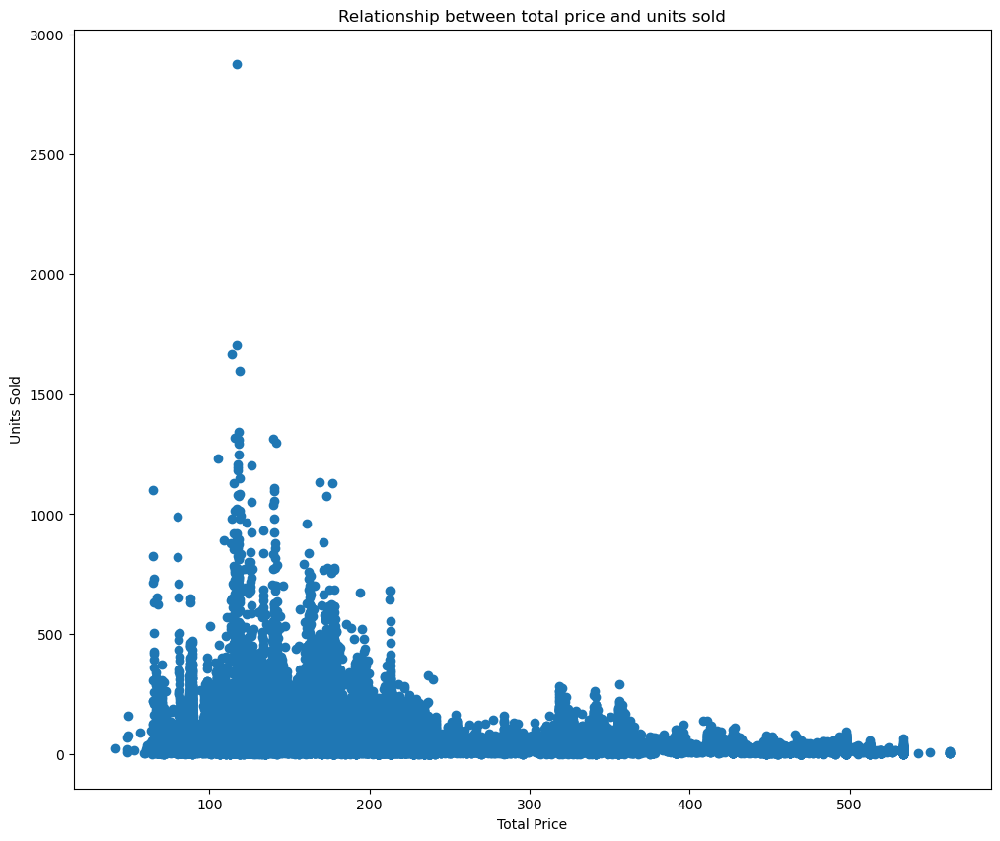

In [9]:
# using matplotlib
plt.figure(figsize= (12,10))
plt.xlabel("Total Price")
plt.ylabel("Units Sold")
plt.title("Relationship between total price and units sold")
plt.scatter(df1["Total Price"], df1["Units Sold"])

at low prices, the sale of goods explodes

In [10]:
# view correlations between variables in the data
df1.corr()

,ID,Store ID,Total Price,Base Price,Units Sold
ID,1.000000,0.007461,0.008473,0.018911,-0.010608
Store ID,0.007461,1.000000,-0.038315,-0.038855,-0.004369
Total Price,0.008473,-0.038315,1.000000,0.958885,-0.235625
Base Price,0.018911,-0.038855,0.958885,1.000000,-0.140022
Units Sold,-0.010608,-0.004369,-0.235625,-0.140022,1.000000


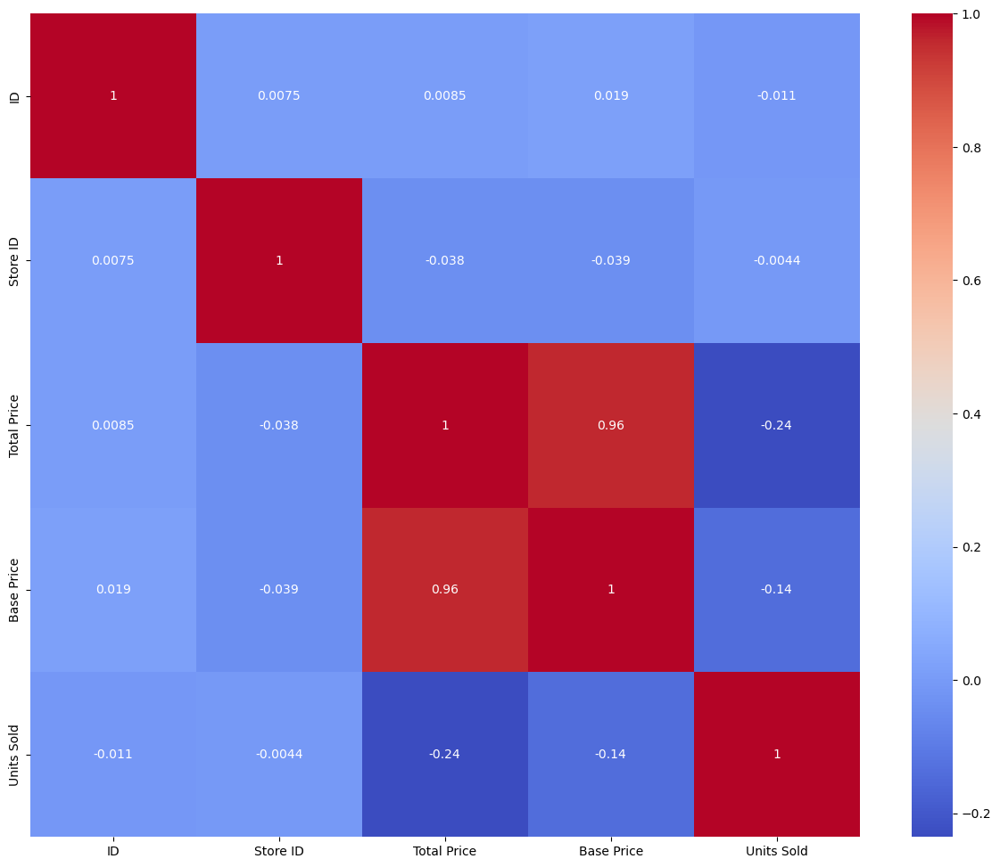

In [11]:
correlation = df1.corr()
import seaborn as sns
plt.figure(figsize= (15,12))
sns.heatmap(correlation, cmap= "coolwarm", annot= True)
plt.show()

very high correlation between total price and base price

train a machine learning algorithim

In [12]:
df1.columns

Index(['ID', 'Store ID', 'Total Price', 'Base Price', 'Units Sold'], dtype='object')

In [13]:
X = df1.drop(["ID", "Store ID"], axis= 1)
y = df1["Units Sold"]



In [14]:
X.head()

,Total Price,Base Price,Units Sold
0,99.0375,111.8625,20
1,99.0375,99.0375,28
2,133.9500,133.9500,19
3,133.9500,133.9500,44
4,141.0750,141.0750,52


In [15]:
y.head()

0    20
1    28
2    19
3    44
4    52
Name: Units Sold, dtype: int64

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 42)

compare performance of various classifiers

In [18]:
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# import required classifiers
# since this is a regression problem, try using regression algorithims

from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import PassiveAggressiveRegressor
from sklearn.svm import SVC



In [ ]:

def find_best_model_using_gridsearchcv(X_train, y_train):
    algos = {
    'linear_regression': {
        'model': LinearRegression(),
        'params': {
            'normalize': [True, False]
        }
    },
    'lasso': {
        'model': Lasso(),
        'params':{
            'alpha': [1,2],
            'selection': ['random', 'cyclic']
        }
    },
    'PassiveAggressiveRegressor': {
        'model': PassiveAggressiveRegressor(),
        'params':{
                'C' : np.logspace(-4, 4, 20),
                'fit_intercept': [True, False],
                'early_stopping': [True, False],
                'shuffle': [True, False],
                'epsilon': np.logspace(-4, 4, 20),
                'warm_start': [True, False],
                'average': [True, False]
        }
    },# dt classifier
    'decision_tree': {
        'model': DecisionTreeRegressor(),
        'params': {
            'criterion': ['mse', 'friedman_mse'],
            'splitter': ['best', 'random']
            }
        },
    'XGBoost': {
          'model': XGBRegressor(),
          'params': {
              'booster': ["gbtree", "gblinear", "dart"],
              'n_estimators': [100, 200, 300, 400, 500],
              'learning_rate': [0.01, 0.05, 0.1, 0.2],
              'max_depth': [3, 4, 5, 6, 7],
              'min_child_weight': [1, 2, 3, 4, 5],
              'gamma': [0, 0.1, 0.2, 0.3, 0.4],
              'subsample': [0.5, 0.6, 0.7, 0.8, 0.9],
              'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9]
            }
       },
      
       'RandomForestRegressor' : {
           'model' : RandomForestRegressor(),
           'params' : {
               'n_estimators' : list(range(10,101,10)),
               'max_features' : ['auto', 'sqrt', 'log2'],
               'criterion' : ['squared_error', 'absolute_error', 'poisson']
           }
       },
       'svm': {
        'model': SVC(),
        'params' : {
            'C': [1,10,100,1000],
            'kernel': ['rbf','linear']
        }  
       },
        'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params':{
            'n_neighbors': [1,10,100,1000],
            'weights': ["uniform", "distance"],
            'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
            
        }
    }

    }


    scores = []
    cv = ShuffleSplit(n_splits= 5, test_size= 0.2, random_state= 0)
    # for loop
    for algo_name, config in algos.items():
        gs = GridSearchCV(config['model'], config['params'], cv= cv, return_train_score= False)
        gs.fit(X_train, y_train)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })
    
    result = pd.DataFrame(scores, columns= ['model', 'best_score', 'best_params']) 

    result.to_csv("compare_models.csv", index= False)
    
    return result

